In [1]:
# importlib: 사용자가 파이썬의 import 시스템과 상호작용하기 위한 API를 제공하는 내장 라이브러리
# 사용자는 import 함수의 구현 내용과, 실행에 필요한 하위 함수들을 이용해 필요에 맞는 임포터를 직접 구현하거나 임포트 관련 기능들을 자유롭게 사용할 수 있음
# importlib.metadata: 설치된 패키지 메타 데이터에 대한 접근을 제공하는 라이브러리.
# 해당 코드 블럭에서는 importlib.metadata 안에 있는 version() 함수를 이용하여 pixellib 라이브러리의 버전을 확인

from importlib.metadata import version
import cv2
import pixellib

print(cv2.__version__)
print(version('pixellib'))

4.5.3
0.7.1


#### Step 1. 인물모드 직접 해 보기
---
- 여러분의 셀카를 이용해서 오늘 배운 내용을 수행해 봅시다. 아래와 같은 이미지를 얻어야 합니다. 최소 3장 이상의 인물모드 사진을 만들어 봅시다.
- 인물이 주인공이 아닌, 귀여운 고양이에 대한 아웃포커싱 사진도 만들어 볼 수 있을 것입니다. 시맨틱 세그멘테이션 스텝에서 힌트를 찾아봅시다.
- 배경을 blur하는 인물모드 사진이 아니라 배경사진을 다른 이미지로 교체하는 크로마키 배경 합성을 시도해 볼 수도 있을 것입니다. 여러분만의 환상적인 사진을 만들어 보면 어떨까요?



1단계: 원본 이미지 로드 중
sc1.jpg 이미지 크기: (1018, 1357, 3)
sc2.jpg 이미지 크기: (1018, 1357, 3)
sc3.jpg 이미지 크기: (1018, 1357, 3)


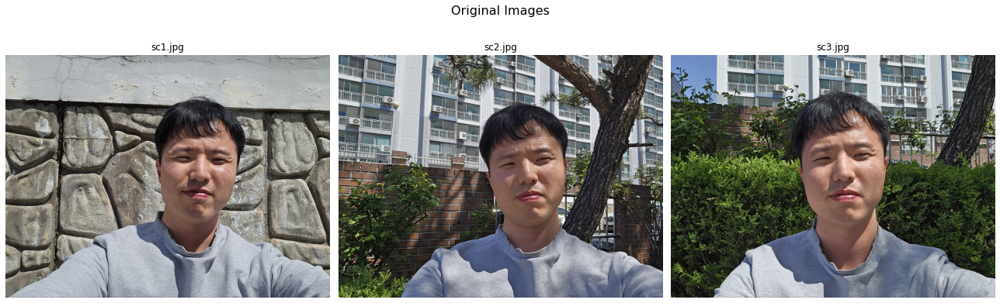


2단계: 의미적 분할 수행 중
sc1.jpg 탐지된 클래스: background, person
sc2.jpg 탐지된 클래스: background, person
sc3.jpg 탐지된 클래스: background, person


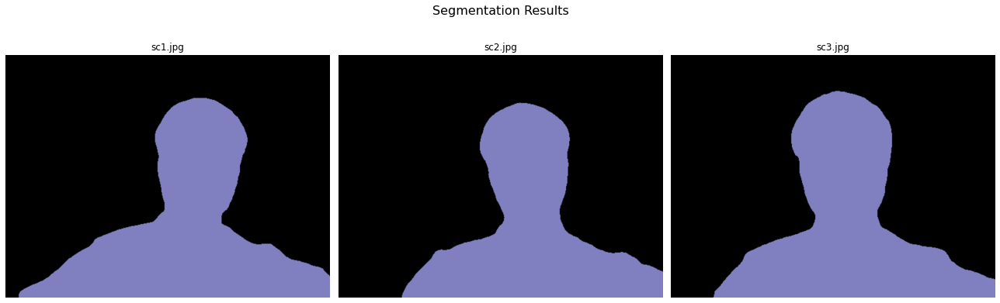


3단계: 사람 마스크 생성 중


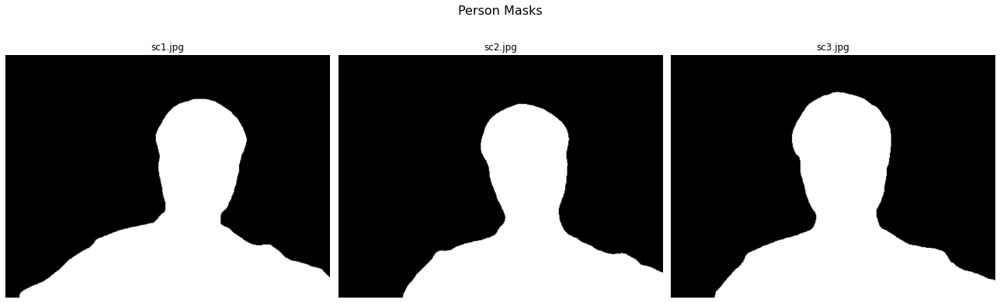


4단계: 색상 오버레이 적용 중


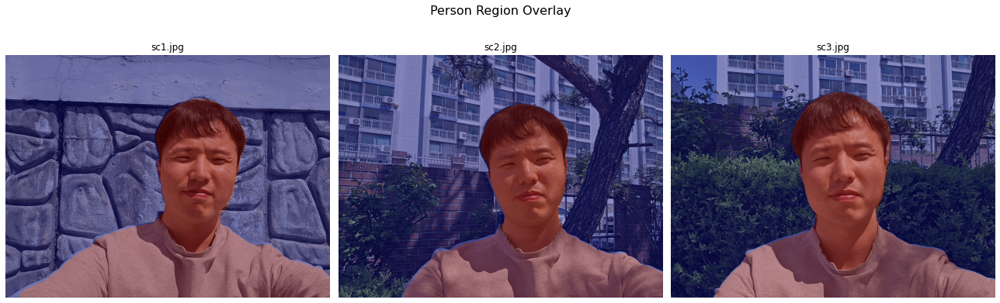


5단계: 원본 이미지 블러 처리 중


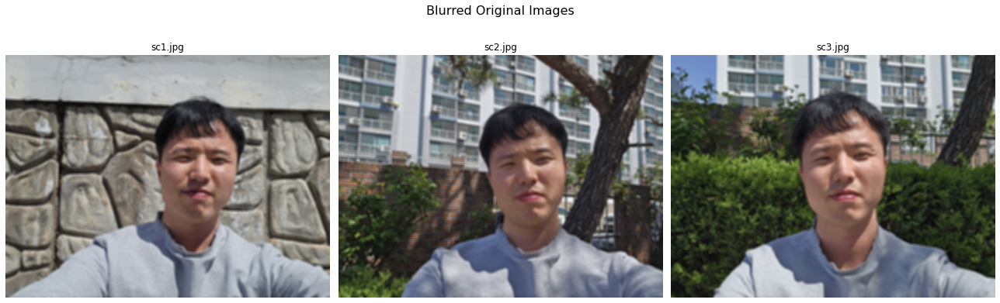


6단계: 블러된 배경 생성 중


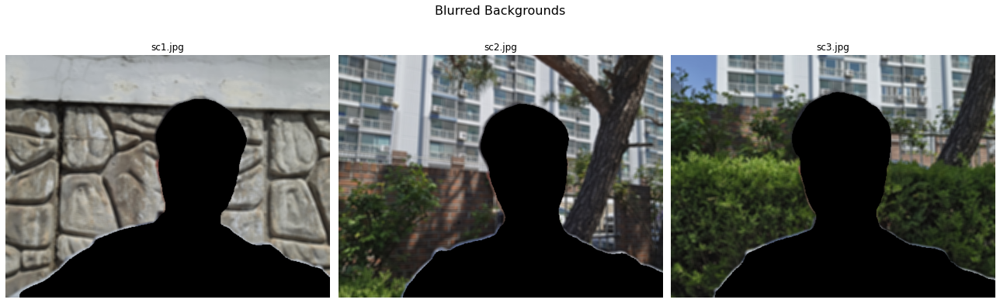


7단계: 최종 결과 생성 중


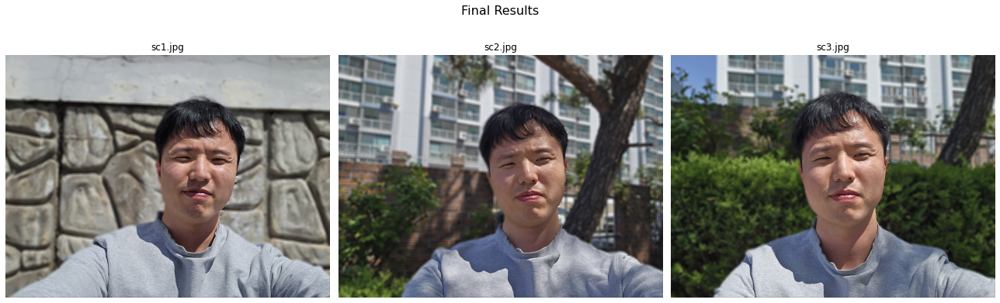


최종 단계: 각 이미지별 전체 처리 과정 요약


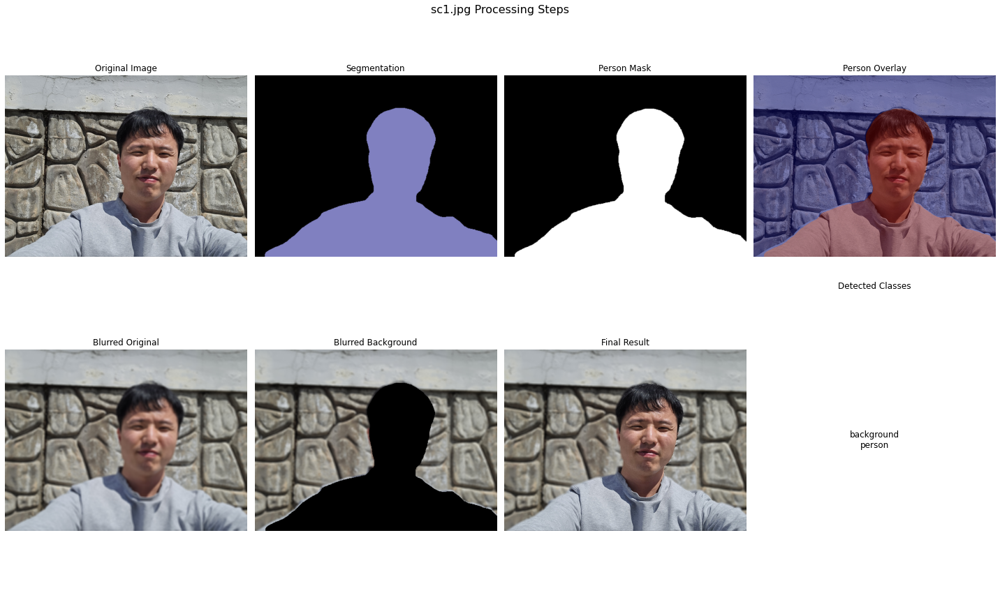

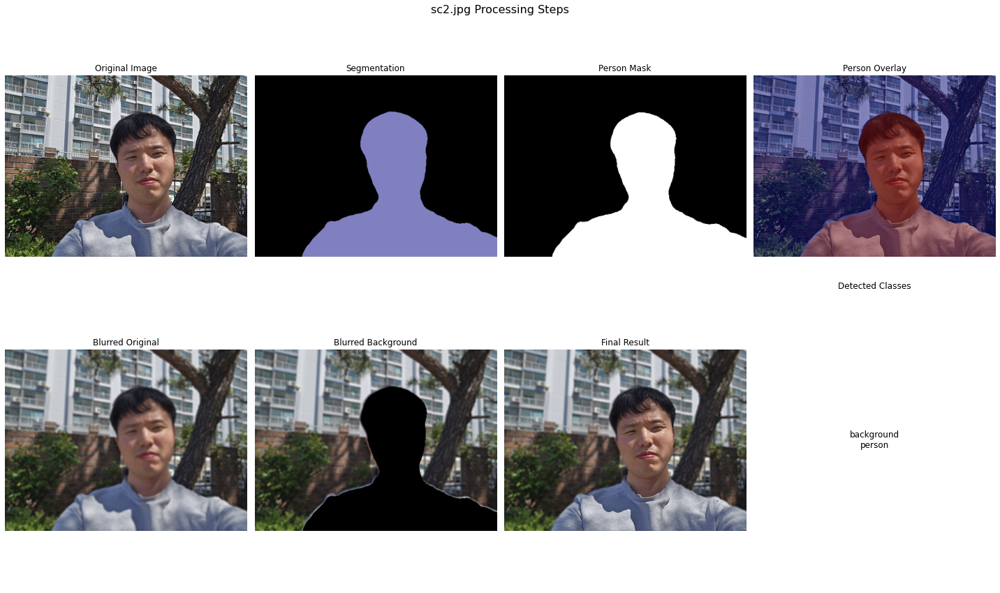

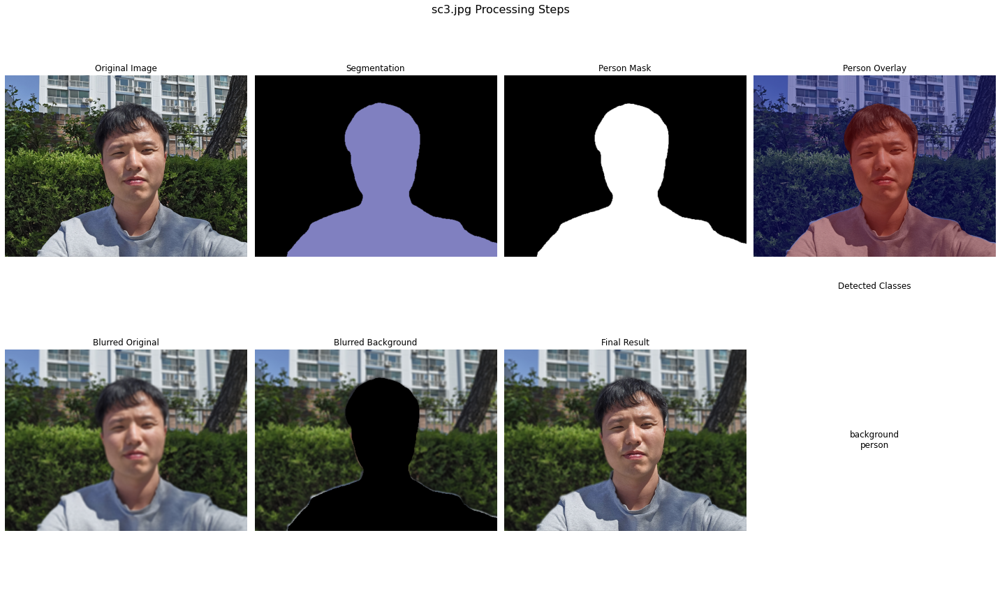

In [2]:
import os
import urllib
import cv2
import numpy as np
from pixellib.semantic import semantic_segmentation
from matplotlib import pyplot as plt

# print('Processing started!')

# 모델 디렉토리 및 파일 경로 설정
model_dir = os.getenv('HOME')+'/aiffel/human_segmentation/models' 
os.makedirs(model_dir, exist_ok=True)
model_file = os.path.join(model_dir, 'deeplabv3_xception_tf_dim_ordering_tf_kernels.h5')

# 필요한 경우 모델 다운로드
model_url = 'https://github.com/ayoolaolafenwa/PixelLib/releases/download/1.1/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5' 
if not os.path.exists(model_file):
    print("모델 다운로드 중...")
    urllib.request.urlretrieve(model_url, model_file)
    print("모델 다운로드 완료")

# 모델 로드
model = semantic_segmentation()
model.load_pascalvoc_model(model_file)

# PASCAL VOC 클래스 이름 정의
LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
]

# 컬러맵 생성
colormap = np.zeros((256, 3), dtype=int)
ind = np.arange(256, dtype=int)
for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

# 이미지 파일 목록
image_files = ['sc1.jpg', 'sc2.jpg', 'sc3.jpg']
image_dir = os.getenv('HOME')+'/aiffel/person-mode_ss'
os.makedirs(image_dir, exist_ok=True)

# 최종 요약을 위한 저장소
final_results = {
    'orig_imgs': [],
    'seg_outputs': [],
    'seg_maps': [],
    'overlay_imgs': [],
    'orig_blurs': [],
    'bg_blurs': [],
    'final_imgs': [],
    'detected_classes': []
}

# 이미지 존재 여부 확인
valid_images = []
for image_file in image_files:
    img_path = os.path.join(image_dir, image_file)
    if os.path.exists(img_path):
        valid_images.append(image_file)
    else:
        print(f"경고: 이미지 파일 {img_path}이(가) 존재하지 않습니다!")

if not valid_images:
    print("유효한 이미지를 찾을 수 없습니다. 종료합니다.")
    exit()

# 1단계: 원본 이미지 로드 및 표시
print("\n1단계: 원본 이미지 로드 중")
orig_images = []

plt.figure(figsize=(18, 6))
plt.suptitle("Original Images", fontsize=16)

for i, image_file in enumerate(valid_images):
    img_path = os.path.join(image_dir, image_file)
    img_orig = cv2.imread(img_path)
    print(f"{image_file} 이미지 크기:", img_orig.shape)
    
    # BGR에서 RGB로 변환하여 표시
    img_rgb = cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB)
    orig_images.append(img_orig)  # 처리를 위해 원본 유지
    final_results['orig_imgs'].append(img_rgb)  # 요약을 위해 저장
    
    # 표시
    plt.subplot(1, len(valid_images), i+1)
    plt.imshow(img_rgb)
    plt.title(f"{image_file}")
    plt.axis('off')

plt.tight_layout()
plt.show()

# 2단계: 세그먼테이션 수행 및 표시
print("\n2단계: 의미적 분할 수행 중")
seg_outputs = []
seg_values = []

plt.figure(figsize=(18, 6))
plt.suptitle("Segmentation Results", fontsize=16)

for i, (image_file, img_orig) in enumerate(zip(valid_images, orig_images)):
    img_path = os.path.join(image_dir, image_file)
    
    # 세그먼테이션 수행
    segvalues, output = model.segmentAsPascalvoc(img_path)
    seg_outputs.append(output)
    seg_values.append(segvalues)
    final_results['seg_outputs'].append(output)
    
    # 탐지된 클래스 처리
    detected_classes = []
    for class_id in segvalues['class_ids']:
        detected_classes.append(LABEL_NAMES[class_id])
    final_results['detected_classes'].append(detected_classes)
    print(f"{image_file} 탐지된 클래스:", ", ".join(detected_classes))
    
    # 표시
    plt.subplot(1, len(valid_images), i+1)
    plt.imshow(output)
    plt.title(f"{image_file}")
    plt.axis('off')

plt.tight_layout()
plt.show()

# 3단계: 사람 마스크 생성 및 표시
print("\n3단계: 사람 마스크 생성 중")
seg_maps = []

plt.figure(figsize=(18, 6))
plt.suptitle("Person Masks", fontsize=16)

for i, (image_file, output) in enumerate(zip(valid_images, seg_outputs)):
    # 사람 마스크 생성
    seg_color = (128, 128, 192)  # 사람 색상 (BGR)
    seg_map = np.all(output == seg_color, axis=-1)
    seg_maps.append(seg_map)
    final_results['seg_maps'].append(seg_map)
    
    # 표시
    plt.subplot(1, len(valid_images), i+1)
    plt.imshow(seg_map, cmap='gray')
    plt.title(f"{image_file}")
    plt.axis('off')

plt.tight_layout()
plt.show()

# 4단계: 색상 오버레이 적용 및 표시
print("\n4단계: 색상 오버레이 적용 중")
overlay_imgs = []

plt.figure(figsize=(18, 6))
plt.suptitle("Person Region Overlay", fontsize=16)

for i, (image_file, img_orig, seg_map) in enumerate(zip(valid_images, orig_images, seg_maps)):
    # 마스크 및 오버레이 생성
    img_show = img_orig.copy()
    img_mask = seg_map.astype(np.uint8) * 255
    color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)
    img_overlay = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)
    img_overlay_rgb = cv2.cvtColor(img_overlay, cv2.COLOR_BGR2RGB)
    overlay_imgs.append(img_overlay_rgb)
    final_results['overlay_imgs'].append(img_overlay_rgb)
    
    # 표시
    plt.subplot(1, len(valid_images), i+1)
    plt.imshow(img_overlay_rgb)
    plt.title(f"{image_file}")
    plt.axis('off')

plt.tight_layout()
plt.show()

# 5단계: 원본 이미지 블러 처리 및 표시
print("\n5단계: 원본 이미지 블러 처리 중")
orig_blurs = []

plt.figure(figsize=(18, 6))
plt.suptitle("Blurred Original Images", fontsize=16)

for i, (image_file, img_orig) in enumerate(zip(valid_images, orig_images)):
    # Blur image
    img_orig_blur = cv2.blur(img_orig, (13, 13))
    img_orig_blur_rgb = cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB)
    orig_blurs.append(img_orig_blur)  # BGR 형식 유지 (처리용)
    final_results['orig_blurs'].append(img_orig_blur_rgb)  # RGB 형식 저장 (표시용)
    
    # 표시
    plt.subplot(1, len(valid_images), i+1)
    plt.imshow(img_orig_blur_rgb)
    plt.title(f"{image_file}")
    plt.axis('off')

plt.tight_layout()
plt.show()

# 6단계: 블러된 배경 생성 및 표시
print("\n6단계: 블러된 배경 생성 중")
bg_blurs = []
img_masks = []

plt.figure(figsize=(18, 6))
plt.suptitle("Blurred Backgrounds", fontsize=16)

for i, (image_file, img_orig_blur, seg_map) in enumerate(zip(valid_images, orig_blurs, seg_maps)):
    # Create background mask
    img_mask = seg_map.astype(np.uint8) * 255
    img_masks.append(img_mask)  # 최종 단계를 위해 저장
    img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
    img_bg_mask = cv2.bitwise_not(img_mask_color)
    
    # 블러된 이미지에 마스크 적용
    img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
    img_bg_blur_rgb = cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB)
    bg_blurs.append(img_bg_blur)  # BGR 형식 유지 (처리용)
    final_results['bg_blurs'].append(img_bg_blur_rgb)  # RGB 형식 저장 (표시용)
    
    # 표시
    plt.subplot(1, len(valid_images), i+1)
    plt.imshow(img_bg_blur_rgb)
    plt.title(f"{image_file}")
    plt.axis('off')

plt.tight_layout()
plt.show()

# 7단계: 최종 결과 생성 및 표시
print("\n7단계: 최종 결과 생성 중")
final_imgs = []

plt.figure(figsize=(18, 6))
plt.suptitle("Final Results", fontsize=16)

for i, (image_file, img_orig, img_bg_blur, img_mask) in enumerate(zip(valid_images, orig_images, bg_blurs, img_masks)):
    # 최종 합성 이미지 생성
    img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
    img_concat = np.where(img_mask_color == 255, img_orig, img_bg_blur)
    img_concat_rgb = cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB)
    final_imgs.append(img_concat_rgb)
    final_results['final_imgs'].append(img_concat_rgb)
    
#     # 결과 저장
#     result_path = os.path.join(image_dir, f"result_{image_file}")
#     cv2.imwrite(result_path, img_concat)
#     print(f"결과 저장됨: {result_path}")
    
    # 표시
    plt.subplot(1, len(valid_images), i+1)
    plt.imshow(img_concat_rgb)
    plt.title(f"{image_file}")
    plt.axis('off')

plt.tight_layout()
plt.show()

# 최종 단계: 각 이미지별 전체 처리 과정 표시
print("\n최종 단계: 각 이미지별 전체 처리 과정 요약")

for i, img_file in enumerate(valid_images):
    plt.figure(figsize=(20, 12))
    plt.suptitle(f"{img_file} Processing Steps", fontsize=16)
    
    # 원본 이미지
    plt.subplot(2, 4, 1)
    plt.imshow(final_results['orig_imgs'][i])
    plt.title("Original Image")
    plt.axis('off')
    
    # 세그먼테이션
    plt.subplot(2, 4, 2)
    plt.imshow(final_results['seg_outputs'][i])
    plt.title("Segmentation")
    plt.axis('off')
    
    # 마스크
    plt.subplot(2, 4, 3)
    plt.imshow(final_results['seg_maps'][i], cmap='gray')
    plt.title("Person Mask")
    plt.axis('off')
    
    # 오버레이
    plt.subplot(2, 4, 4)
    plt.imshow(final_results['overlay_imgs'][i])
    plt.title("Person Overlay")
    plt.axis('off')
    
    # 블러 처리된 원본
    plt.subplot(2, 4, 5)
    plt.imshow(final_results['orig_blurs'][i])
    plt.title("Blurred Original")
    plt.axis('off')
    
    # 블러된 배경
    plt.subplot(2, 4, 6)
    plt.imshow(final_results['bg_blurs'][i])
    plt.title("Blurred Background")
    plt.axis('off')
    
    # 최종 결과
    plt.subplot(2, 4, 7)
    plt.imshow(final_results['final_imgs'][i])
    plt.title("Final Result")
    plt.axis('off')
    
    # 탐지된 클래스 (텍스트)
    plt.subplot(2, 4, 8)
    plt.text(0.5, 0.5, "\n".join(final_results['detected_classes'][i]), 
             ha='center', va='center', fontsize=12)
    plt.title("Detected Classes")
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# print("\nAll processing and visualization complete!")


8단계: 딥 포커스 효과 생성 중


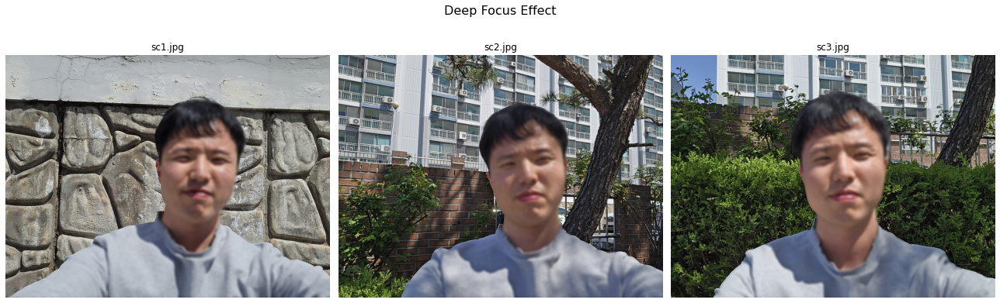

In [3]:
# 8단계: 딥 포커스 효과(아웃 오브 포커스의 반대) 생성 및 표시
print("\n8단계: 딥 포커스 효과 생성 중")
deep_focus_imgs = []

plt.figure(figsize=(18, 6))
plt.suptitle("Deep Focus Effect", fontsize=16)

for i, (image_file, img_orig, img_orig_blur, img_mask) in enumerate(zip(valid_images, orig_images, orig_blurs, img_masks)):
    # 딥 포커스 이미지 생성 (배경 대신 사람을 흐리게 처리)
    img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
    # 조건 반전 - 사람은 흐리게, 배경은 선명하게 유지
    img_deep_focus = np.where(img_mask_color == 255, img_orig_blur, img_orig)
    img_deep_focus_rgb = cv2.cvtColor(img_deep_focus, cv2.COLOR_BGR2RGB)
    deep_focus_imgs.append(img_deep_focus_rgb)
    final_results['deep_focus_imgs'] = deep_focus_imgs
    
#     # 결과 저장
#     result_path = os.path.join(image_dir, f"deep_focus_{image_file}")
#     cv2.imwrite(result_path, img_deep_focus)
#     print(f"Deep focus result saved: {result_path}")
    
    # 표시
    plt.subplot(1, len(valid_images), i+1)
    plt.imshow(img_deep_focus_rgb)
    plt.title(f"{image_file}")
    plt.axis('off')

plt.tight_layout()
plt.show()


9단계: 크로마키 효과와 배경 교체 생성 중
배경 이미지 로드됨, 크기: (500, 892, 3)


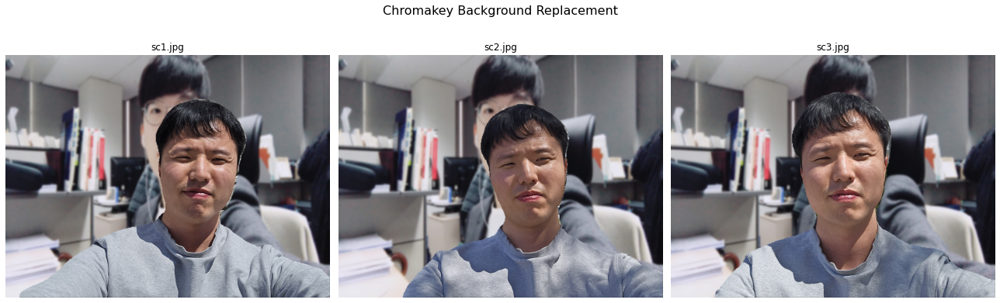

In [4]:
# 9단계: 크로마키 효과와 배경 교체 생성
print("\n9단계: 크로마키 효과와 배경 교체 생성 중")
chromakey_imgs = []

plt.figure(figsize=(18, 6))
plt.suptitle("Chromakey Background Replacement", fontsize=16)

# 배경 이미지 로드
bg_image_path = os.getenv('HOME')+'/aiffel/person-mode_ss/my_image.png'
if not os.path.exists(bg_image_path):
    print(f"경고: 배경 이미지 {bg_image_path}이(가) 존재하지 않습니다!")
    # 이미지가 존재하지 않는 경우 기본 컬러 배경 생성
    bg_image = np.ones((800, 800, 3), dtype=np.uint8) * np.array([0, 120, 255], dtype=np.uint8)
else:
    bg_image = cv2.imread(bg_image_path)
    print( f"배경 이미지 로드됨, 크기: {bg_image.shape}")

for i, (image_file, img_orig, seg_map) in enumerate(zip(valid_images, orig_images, seg_maps)):
    # 사람 마스크 생성
    img_mask = seg_map.astype(np.uint8) * 255
    img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
    
    # 원본 이미지 크기에 맞게 배경 이미지 크기 조정
    h, w, _ = img_orig.shape
    bg_resized = cv2.resize(bg_image, (w, h), interpolation=cv2.INTER_AREA)
    
    # 멋진 깊이 효과를 위해 배경에 약간의 블러 적용
    bg_resized_blur = cv2.GaussianBlur(bg_resized, (21, 21), 0)
    
    # 조합: 원본 이미지의 사람 + 새로운 블러된 배경
    img_chromakey = np.where(img_mask_color == 255, img_orig, bg_resized_blur)
    img_chromakey_rgb = cv2.cvtColor(img_chromakey, cv2.COLOR_BGR2RGB)
    chromakey_imgs.append(img_chromakey_rgb)
    final_results['chromakey_imgs'] = chromakey_imgs
    
#     # 결과 저장
#     result_path = os.path.join(image_dir, f"chromakey_{image_file}")
#     cv2.imwrite(result_path, img_chromakey)
#     print(f"크로마키 결과 저장됨: {result_path}")
    
    # 표시
    plt.subplot(1, len(valid_images), i+1)
    plt.imshow(img_chromakey_rgb)
    plt.title(f"{image_file}")
    plt.axis('off')

plt.tight_layout()
plt.show()

#### Step 2. 사진에서 문제점 찾기
---
- 아래 사진에는 이상한 점이 최소 2개 이상 더 있습니다. 어떤 문제가 있는지 찾아서 아래 사진처럼 표시해 봅시다.
- 여러분이 만들어 낸 인물 모드 사진 중 하나에서도 이상한 위치를 찾아 아래 사진처럼 표시해 봅시다. 표시한 이미지들을 jupyter notebook에 포함하여 제출해 주세요.

![사진에서 문제점 찾기](E-14-13.max-800x600.png)
>* 왼쪽에 이어폰이 끊어져 있음  
>* 경계의 부자연스러움  
>* <U>원근감에 따른 블러링 정도가 없음</U>

#### Step 3. 해결 방법을 제안해 보기
---
- 생각해 볼 만한 주제를 아래에 몇 가지 제시해 봅니다. 아래를 읽어본 후, 여러분이 만든 인물모드 사진의 문제점을 해결할 방안을 정리하여 제안해 주시기 바랍니다.
 - 단순히 'XXX 기술을 사용한다.' 정도의 선언적 솔루션이 아니라, 여러분들이 선택한 기술이 DeepLab 모델의 Semantic Segmentation 이 만들어 낸 Mask 영역에 어떻게 적용되어 문제점을 보완하게 되는지의 메커니즘이 포함된 솔루션이어야 합니다.

(500, 892, 3)


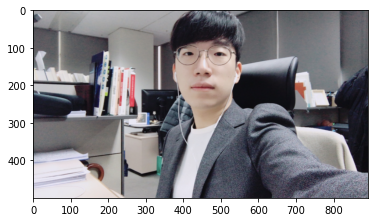

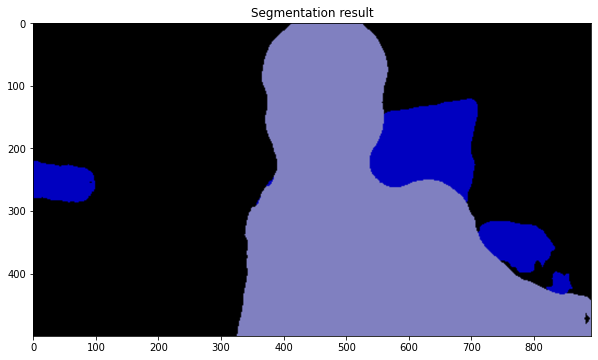

검출된 클래스:
0: background
9: chair
15: person


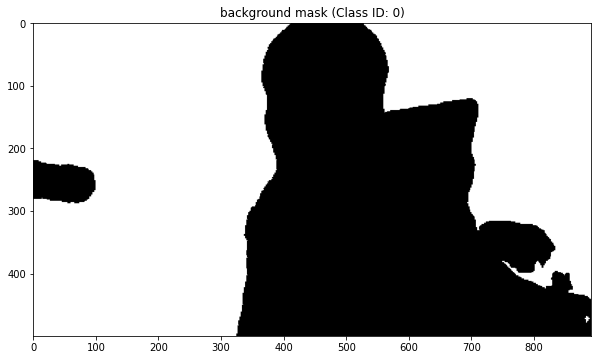

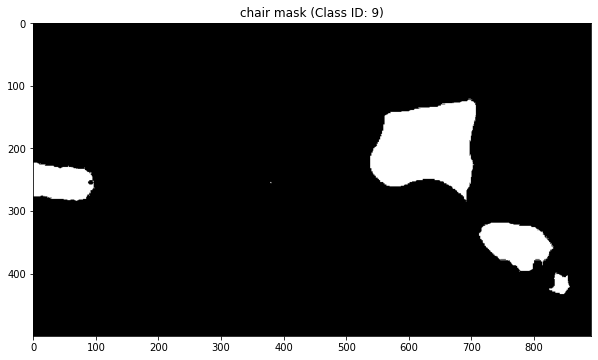

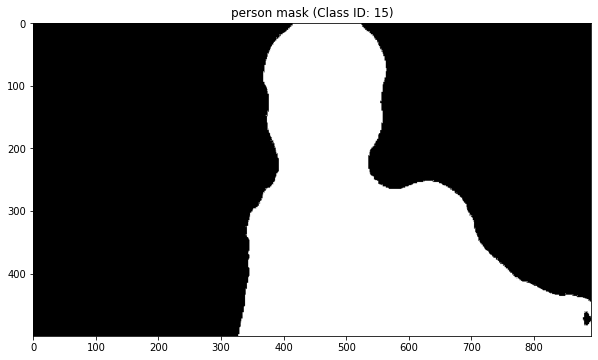

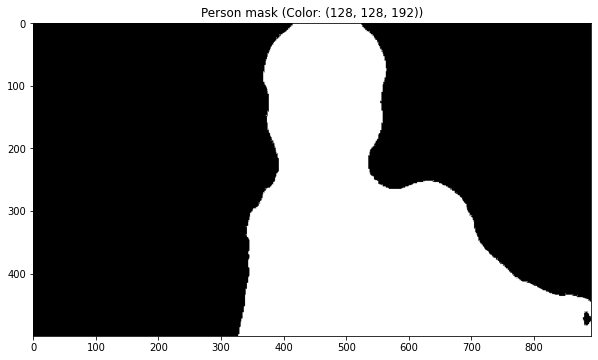

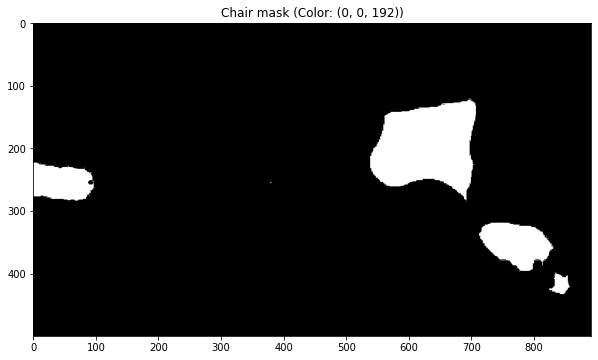

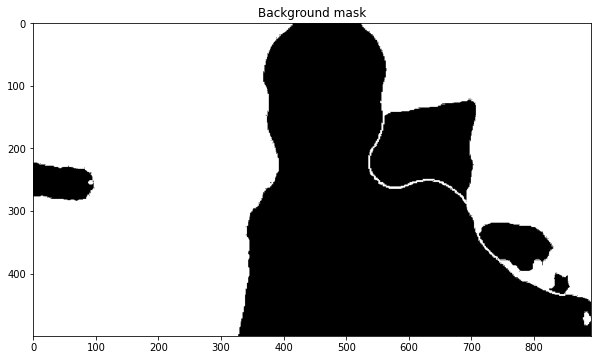

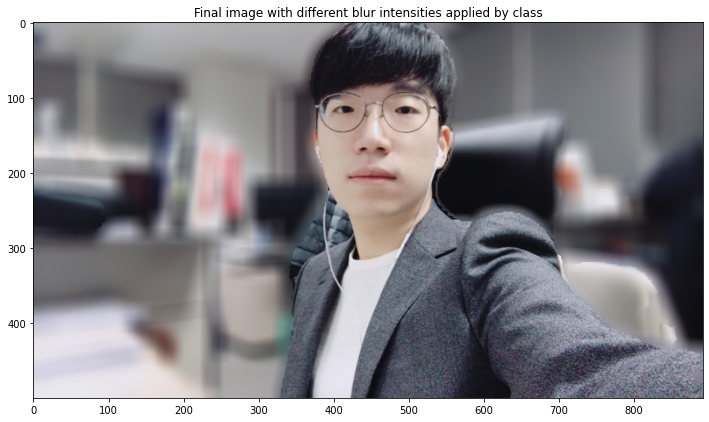

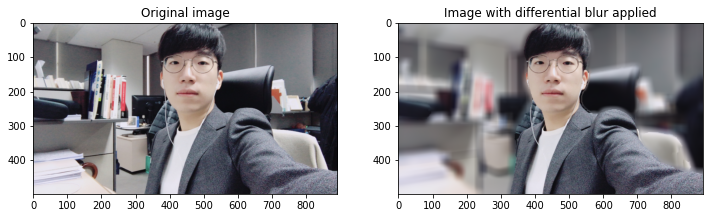

In [5]:
# 사진의 문제점에 대해 범모님이 원근감에 따른 블러링 정도가 없다고 하셔서 물론 3D 인식으로 블러링 정도를 
# 조절할 수 있겠지만, 지금으로써는 무리니 할당된 라벨에 따라 블러링을 차등 적용해서 사진에서의 입체감을
# 높임. 이 코드는 미리 라벨 구성이나 블러링 정도를 약속하고 있지만, 입체적인 정보를 통해 유기적으로 바꿔도
# 좋을 것 같다.
import os
import urllib
import cv2
import numpy as np
from pixellib.semantic import semantic_segmentation
from matplotlib import pyplot as plt

# print('슝=3')

# 이미지 로드
img_path = os.getenv('HOME')+'/aiffel/person-mode_ss/my_image.png'
img_orig = cv2.imread(img_path) 
print(img_orig.shape)
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

# 모델 로드
model_dir = os.getenv('HOME')+'/aiffel/human_segmentation/models' 
model_file = os.path.join(model_dir, 'deeplabv3_xception_tf_dim_ordering_tf_kernels.h5')
model_url = 'https://github.com/ayoolaolafenwa/PixelLib/releases/download/1.1/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5' 

# 모델 파일이 없으면 다운로드
if not os.path.exists(model_file):
    if not os.path.exists(model_dir):
        os.makedirs(model_dir)
    urllib.request.urlretrieve(model_url, model_file)

# 세그멘테이션 수행
model = semantic_segmentation()
model.load_pascalvoc_model(model_file)
segvalues, output = model.segmentAsPascalvoc(img_path)

# 라벨 이름 목록
LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
]

# 원본 세그멘테이션 결과 표시
plt.figure(figsize=(10, 8))
plt.imshow(output)
plt.title("Segmentation result")
plt.show()

# 검출된 클래스 출력
detected_classes = segvalues['class_ids']
print("검출된 클래스:")
for class_id in detected_classes:
    print(f"{class_id}: {LABEL_NAMES[class_id]}")

# 각 클래스별 블러 강도 정의
blur_intensities = {
    0: (25, 25),  # 배경: 강한 블러
    9: (15, 15),  # 의자: 중간 블러
    15: (1, 1)    # 사람: 블러 없음 (또는 최소 블러)
}

# 각 클래스별 마스크를 저장할 딕셔너리
class_masks = {}

# 각 검출된 클래스에 대한 마스크 생성
for class_id in detected_classes:
    # 해당 클래스의 색상을 가져옴 (PascalVOC 색상 맵)
    # 예: 사람(15)은 (128, 0, 192)로 표시됨
    # 여기서는 RGB가 아닌 BGR 순서로 변환해야 함
    
    # 클래스별 마스크 생성 (각 픽셀이 해당 클래스에 속하는지 여부)
    class_mask = np.zeros_like(output[:,:,0], dtype=bool)
    
    # 세그멘테이션 결과에서 해당 클래스에 해당하는 영역을 찾음
    for i in range(output.shape[0]):
        for j in range(output.shape[1]):
            # output 이미지에서 해당 픽셀이 현재 검사 중인 클래스와 일치하는지 확인
            # 이 부분은 비효율적이지만 명확성을 위해 사용
            for detected_id in segvalues['class_ids']:
                if detected_id == class_id and output[i,j,0] == colormap[class_id][2] and output[i,j,1] == colormap[class_id][1] and output[i,j,2] == colormap[class_id][0]:
                    class_mask[i,j] = True
    
    class_masks[class_id] = class_mask
    
    # 마스크 시각화 (클래스별로 한 번만)
    plt.figure(figsize=(10, 8))
    plt.imshow(class_mask, cmap='gray')
    plt.title(f"{LABEL_NAMES[class_id]} mask (Class ID: {class_id})")
    plt.show()

# colormap 생성 (원본 코드와 동일)
colormap = np.zeros((256, 3), dtype=int)
ind = np.arange(256, dtype=int)
for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

# 사람 클래스 ID (15)
person_id = 15
# 의자 클래스 ID (9)
chair_id = 9
# 배경 클래스 ID (0)
background_id = 0

# 각 클래스에 대한 마스크 생성
# 1. 사람 마스크
if person_id in detected_classes:
    # 원본 코드에서 사용한 방식으로 사람 마스크 생성
    person_color = (128, 128, 192)  # BGR 순서
    person_mask = np.all(output == person_color, axis=-1)
    class_masks[person_id] = person_mask
    
    plt.figure(figsize=(10, 8))
    plt.imshow(person_mask, cmap='gray')
    plt.title(f"Person mask (Color: {person_color})")
    plt.show()

# 2. 의자 마스크
if chair_id in detected_classes:
    # 원본 코드의 접근 방식을 사용하여 의자 마스크 생성
    # 의자에 해당하는 색상을 찾아야 합니다 (시각적 검사를 통해)
    chair_color = (0, 0, 192)  # 실제 결과에 따라 조정 필요
    chair_mask = np.all(output == chair_color, axis=-1)
    class_masks[chair_id] = chair_mask
    
    plt.figure(figsize=(10, 8))
    plt.imshow(chair_mask, cmap='gray')
    plt.title(f"Chair mask (Color: {chair_color})")
    plt.show()

# 3. 배경 마스크 (이미 검출된 객체가 아닌 모든 픽셀)
if background_id in detected_classes:
    # 다른 마스크에 포함되지 않은 모든 픽셀을 배경으로 간주
    background_mask = np.ones_like(output[:,:,0], dtype=bool)
    for class_id, mask in class_masks.items():
        if class_id != background_id:
            background_mask = background_mask & ~mask
    
    class_masks[background_id] = background_mask
    
    plt.figure(figsize=(10, 8))
    plt.imshow(background_mask, cmap='gray')
    plt.title("Background mask")
    plt.show()

# 최종 이미지 생성 (차등 블러 적용)
final_image = np.zeros_like(img_orig)

# 클래스별 블러 적용 (가장 강한 블러부터 적용)
for class_id in [background_id, chair_id, person_id]:  # 배경, 의자, 사람 순서
    if class_id in class_masks and class_id in blur_intensities:
        mask = class_masks[class_id]
        blur_kernel = blur_intensities[class_id]
        
        # 해당 블러 수준으로 원본 이미지의 블러 버전 생성
        blurred_img = cv2.blur(img_orig, blur_kernel)
        
        # 3채널 마스크로 변환
        mask_3ch = np.stack([mask] * 3, axis=-1)
        
        # 최종 이미지에 해당 클래스의 픽셀 추가
        final_image = np.where(mask_3ch, blurred_img, final_image)

# 최종 결과 표시
plt.figure(figsize=(12, 10))
plt.imshow(cv2.cvtColor(final_image, cv2.COLOR_BGR2RGB))
plt.title("Final image with different blur intensities applied by class")
plt.show()

# 원본 이미지와 비교
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.title("Original image")
plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(final_image, cv2.COLOR_BGR2RGB))
plt.title("Image with differential blur applied")
plt.show()

## 참고
___

슝=3
(500, 892, 3)


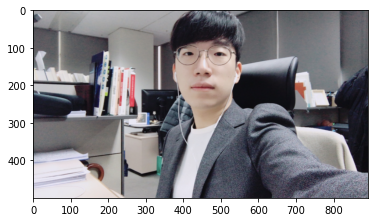

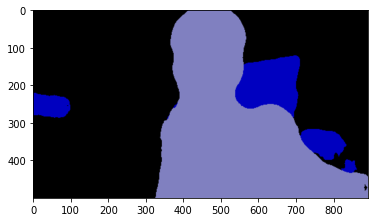

background
chair
person
(500, 892)


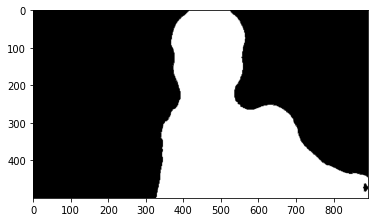

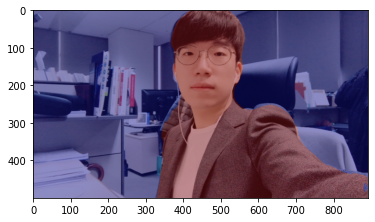

In [2]:
# os: Operating System의 줄임말로, 운영체제에서 제공되는 여러 기능을 파이썬에서 사용할 수 있도록 함 (Ex. 디렉토리 경로 이동, 시스템 환경 변수 가져오기 등)
# urllib: URL 작업을 위한 여러 모듈을 모은 패키지. (Ex. urllib.request, urllib.parse, ...)
# cv2: OpenCV 라이브러리로, 실시간 컴퓨터 비전을 목적으로 한 프로그래밍 라이브러리
# numpy(NumPy): 행렬이나 대규모 다차원 배열을 쉽게 처리할 수 있도록 지원하는 라이브러리. 데이터 구조 외에도 수치 계산을 위해 효율적으로 구현된 기능을 제공
# pixellib: 이미지 및 비디오 segmentation을 수행하기 위한 라이브러리. 
# pixellib.semantic: segmentation 기법 중, semantic segmentation을 쉽게 사용할 수 있도록 만든 라이브러리
# matplotlib: 파이썬 프로그래밍 언어 및 수학적 확장 NumPy 라이브러리를 활용한 플로팅 라이브러리로, 데이터 시각화 도구
import os
import urllib
import cv2
import numpy as np
from pixellib.semantic import semantic_segmentation
from matplotlib import pyplot as plt

print('슝=3')
# os 모듈에 있는 getenv() 함수를 이용하여 읽고싶은 파일의 경로를 file_path에 저장
# 준비한 이미지 파일의 경로를 이용하여, 이미지 파일을 읽음
# cv2.imread(경로): 경로에 해당하는 이미지 파일을 읽어서 변수에 저장
img_path = os.getenv('HOME')+'/aiffel/person-mode_ss/my_image.png'#'/aiffel/human_segmentation/images/my_image.png'  
img_orig = cv2.imread(img_path) 

print(img_orig.shape)

# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 이미지 색상 채널을 변경 (BGR 형식을 RGB 형식으로 변경)
# plt.imshow(): 저장된 데이터를 이미지의 형식으로 표시, 입력은 RGB(A) 데이터 혹은 2D 스칼라 데이터
# https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.imshow.html
# plt.show(): 현재 열려있는 모든 figure를 표시 (여기서 figure는 이미지, 그래프 등)
# https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.show.html
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

# 저장할 파일 이름을 결정합니다
# 1. os.getenv(x)함수는 환경 변수x의 값을 포함하는 문자열 변수를 반환합니다. model_dir 에 "/aiffel/human_segmentation/models" 저장
# 2. #os.path.join(a, b)는 경로를 병합하여 새 경로 생성 model_file 에 "/aiffel/aiffel/human_segmentation/models/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5" 저장
# 1
model_dir = os.getenv('HOME')+'/aiffel/human_segmentation/models' 
# 2
model_file = os.path.join(model_dir, 'deeplabv3_xception_tf_dim_ordering_tf_kernels.h5')

# PixelLib가 제공하는 모델의 url입니다
model_url = 'https://github.com/ayoolaolafenwa/PixelLib/releases/download/1.1/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5' 

# 다운로드를 시작합니다
urllib.request.urlretrieve(model_url, model_file) # urllib 패키지 내에 있는 request 모듈의 urlretrieve 함수를 이용해서 model_url에 있는 파일을 다운로드 해서 model_file 파일명으로 저장

model = semantic_segmentation() #PixelLib 라이브러리 에서 가져온 클래스를 가져와서 semantic segmentation을 수행하는 클래스 인스턴스를 만듬
model.load_pascalvoc_model(model_file) # pascal voc에 대해 훈련된 예외 모델(model_file)을 로드하는 함수를 호출

segvalues, output = model.segmentAsPascalvoc(img_path) # segmentAsPascalvoc()함 수 를 호출 하여 입력된 이미지를 분할, 분할 출력의 배열을 가져옴, 분할 은 pacalvoc 데이터로 학습된 모델을 이용

#pascalvoc 데이터의 라벨종류
LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
]
len(LABEL_NAMES)

#segmentAsPascalvoc() 함수 를 호출하여 입력된 이미지를 분할한 뒤 나온 결과값 중 output을 matplotlib을 이용해 출력
plt.imshow(output)
plt.show()

segvalues # segmentAsPascalvoc() 함수를 호출하여 입력된 이미지를 분할한 뒤 나온 결과값 중 배열값을 출력

#segvalues에 있는 class_ids를 담겨있는 값을 통해 pacalvoc에 담겨있는 라벨을 출력
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])

# 아래 코드를 이해하지 않아도 좋습니다
# PixelLib에서 그대로 가져온 코드입니다
# 주목해야 할 것은 생상 코드 결과물이예요!

#컬러맵 만들기 
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[:20] #생성한 20개의 컬러맵 출력

colormap[15] #컬러맵 15에 해당하는 배열 출력 (pacalvoc에 LABEL_NAMES 15번째인 사람)

seg_color = (128,128,192) # 색상순서 변경 - colormap의 배열은 RGB 순이며 output의 배열은 BGR 순서로 채널 배치가 되어 있어서

# output의 픽셀 별로 색상이 seg_color와 같다면 1(True), 다르다면 0(False)이 됩니다
# seg_color 값이 person을 값이 므로 사람이 있는 위치를 제외하고는 gray로 출력
# cmap 값을 변경하면 다른 색상으로 확인이 가능함
seg_map = np.all(output==seg_color, axis=-1)
print(seg_map.shape)
plt.imshow(seg_map, cmap='gray')
plt.show()

# [
# [ 0 1 1 0 0 0 1 1 0 ],
# [ 1 1 1 1 0 1 1 1 1 ],
# [ 0 1 1 1 1 1 1 1 0 ],
# [ 0 0 1 1 1 1 1 0 0 ],
# [ 0 0 0 1 1 1 0 0 0 ]
# ]

# 원본이미지를 img_show에 할당한뒤 이미지 사람이 있는 위치와 배경을 분리해서 표현한 color_mask 를 만든뒤 두 이미지를 합쳐서 출력
img_show = img_orig.copy()

# True과 False인 값을 각각 255과 0으로 바꿔줍니다
img_mask = seg_map.astype(np.uint8) * 255

# 255와 0을 적당한 색상으로 바꿔봅니다
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

# 원본 이미지와 마스트를 적당히 합쳐봅니다
# 0.6과 0.4는 두 이미지를 섞는 비율입니다.
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

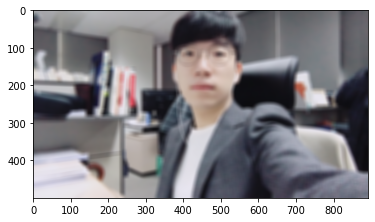

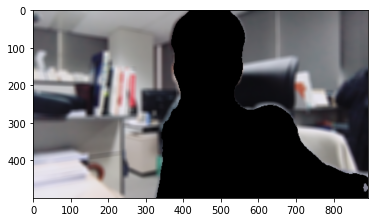

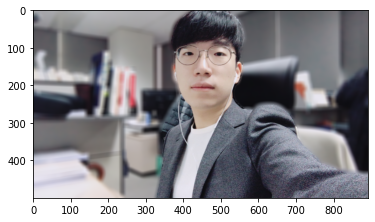

In [3]:
# (13,13)은 blurring kernel size를 뜻합니다
# 다양하게 바꿔보세요
img_orig_blur = cv2.blur(img_orig, (13,13))

# plt.imshow(): 저장된 데이터를 이미지의 형식으로 표시한다.
# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니
# 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경)   
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니
# 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경) 
img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)

# cv2.bitwise_not(): 이미지가 반전됩니다. 배경이 0 사람이 255 였으나
# 연산을 하고 나면 배경은 255 사람은 0입니다.
img_bg_mask = cv2.bitwise_not(img_mask_color)

# cv2.bitwise_and()을 사용하면 배경만 있는 영상을 얻을 수 있습니다.
# 0과 어떤 수를 bitwise_and 연산을 해도 0이 되기 때문에 
# 사람이 0인 경우에는 사람이 있던 모든 픽셀이 0이 됩니다. 결국 사람이 사라지고 배경만 남아요!
img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

# np.where(조건, 참일때, 거짓일때)
# 세그멘테이션 마스크가 255인 부분만 원본 이미지 값을 가지고 오고 
# 아닌 영역은 블러된 이미지 값을 사용합니다.
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)
# plt.imshow(): 저장된 데이터를 이미지의 형식으로 표시한다.
# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니 
# 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경)
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

# Q. 이번에는 사람 부분을 블러로, 배경 부분을 원본으로 출력해볼까요?
# 힌트 : img_mask_color 옵션을 적절히 조정해주고, img_orig, img_orig_blur 를 활용하세요.
# img_concat = np.where(img_mask_color==0, img_orig, img_orig_blur)# [[YOUR CODE]] )
# plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
# plt.show()